In [6]:
import h3
import pandas as pd
import os
import json
from folium import Map, Marker, GeoJson
import branca.colormap as cm
from geojson.feature import *
%matplotlib inline

## Wyniki

In [94]:
results = []
with open('report.jsonl', 'r') as f:
    for line in f.readlines():
        res = json.loads(line)
        results.append({'run_type': res['run type'], **res['metrics']})

In [98]:
results_df = pd.DataFrame(results)
results_df.sort_values(by='Mean squared error')

,run_type,Mean squared error,Mean absolute error,Mean absolute percentage error,Huber loss
1,geo,4165033.50,1383.24,11.14,1382.75
3,geo_mean_osm,4195809.00,1374.61,11.14,1374.12
4,geo_osm,4236872.50,1385.06,11.18,1384.57
2,osm,4989777.50,1493.25,11.90,1492.75
0,mean_osm,5537059.00,1564.31,12.37,1563.82
5,non_geo,5793060.00,1611.02,12.90,1610.53


In [99]:
results_df.sort_values(by='Mean absolute error')

,run_type,Mean squared error,Mean absolute error,Mean absolute percentage error,Huber loss
3,geo_mean_osm,4195809.00,1374.61,11.14,1374.12
1,geo,4165033.50,1383.24,11.14,1382.75
4,geo_osm,4236872.50,1385.06,11.18,1384.57
2,osm,4989777.50,1493.25,11.90,1492.75
0,mean_osm,5537059.00,1564.31,12.37,1563.82
5,non_geo,5793060.00,1611.02,12.90,1610.53


In [100]:
files = [f for f in os.listdir('.') if f.startswith('results') and f.endswith('.png')]
files

['results_non_geo.png',
 'results_geo.png',
 'results_geo_mean_osm.png',
 'results_osm.png',
 'results_mean_osm.png',
 'results_geo_osm.png']

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
fig, axes = plt.subplots(3, len(files)//3, figsize=(10,10))
axes = axes.flatten()
for i, fn in enumerate(files):
    axes[i].imshow(cv2.imread(fn))
    axes[i].set_title(fn.split('.')[0].split('ts_')[1])
    axes[i].set_axis_off()
plt.tight_layout()
plt.show()

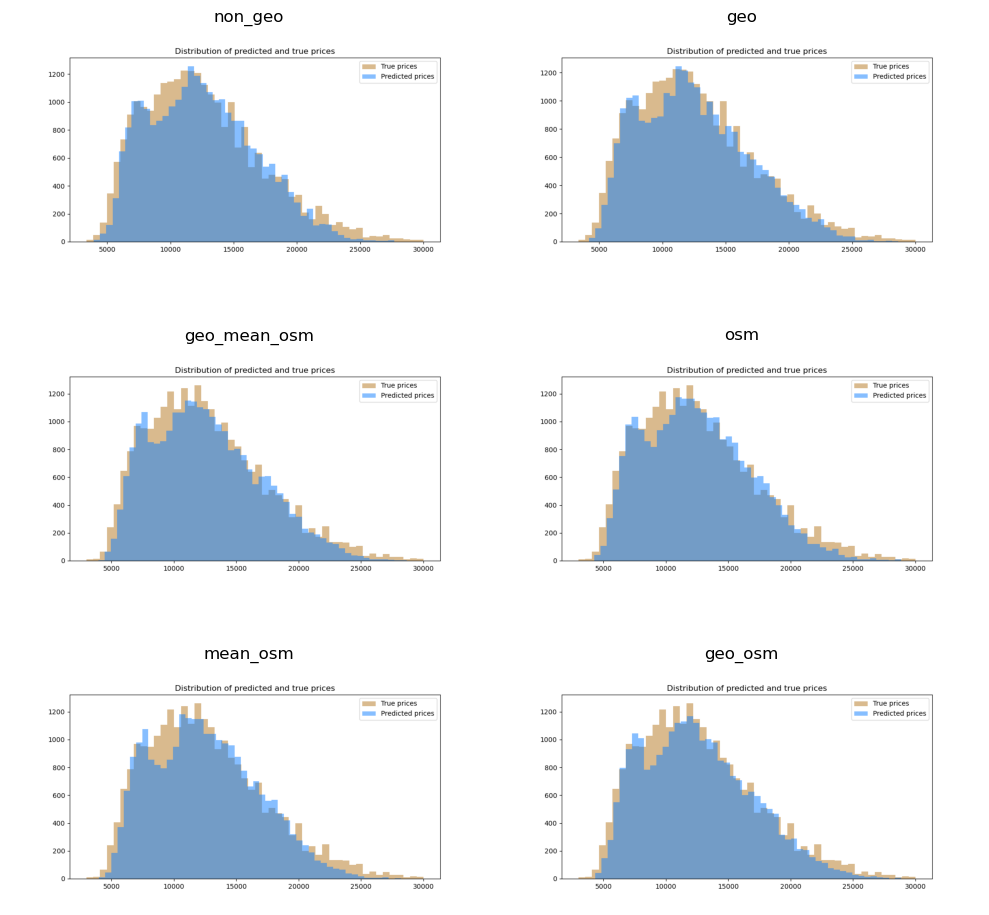

In [115]:
fig, axes = plt.subplots(3, len(files)//3, figsize=(10,10))
axes = axes.flatten()
for i, fn in enumerate(files):
    axes[i].imshow(cv2.imread(fn))
    axes[i].set_title(fn.split('.')[0].split('ts_')[1])
    axes[i].set_axis_off()
plt.tight_layout()
plt.show()

### Wizualizacje

In [26]:
def prepare_geo_dataframe(df, res=9, filter_city = None):
    df['hex'] = df.apply(lambda row: h3.latlng_to_cell(lat = row["latitude"],lng = row["longitude"],res=res), axis = 1)
    df['geometry'] = df['hex'].apply(lambda x: {"type": "Polygon", "coordinates":
        [h3.cell_to_boundary(
            h=x, geo_json=True)]})
    df['price_diff'] = df['price'] - df['predicted_price']
    if filter_city:
        df = df[df['city'] == filter_city]
    return df

In [27]:
test_df = pd.read_pickle("results_mean_osm.pkl")
test_df.head()

,city,type,squareMeters,rooms,floor,floorCount,buildYear,latitude,longitude,ownership,hasParkingSpace,hasBalcony,hasElevator,hasSecurity,hasStorageRoom,region_id,hex_mean,highway_mean,price,predicted_price
22503,gdansk,blockOfFlats,65.00,3.0,3.0,8.0,2017.0,54.34871,18.591210,condominium,0,0,1,0,0,891f7249ba3ffff,-0.056058,-0.073439,12292.307692,12640.985352
83366,wroclaw,apartmentBuilding,71.06,3.0,3.0,3.0,2006.0,51.13650,16.891750,condominium,0,0,0,0,0,891e20431bbffff,-0.016220,-0.145883,9991.556431,12864.075195
3951,gdynia,blockOfFlats,61.96,3.0,2.0,10.0,1987.0,54.47238,18.495550,condominium,0,1,1,0,1,891f724a443ffff,-0.046005,-0.060713,8376.371853,11148.378906
34932,wroclaw,blockOfFlats,58.00,3.0,3.0,4.0,1970.0,51.09900,17.017800,cooperative,1,0,0,0,1,891e2040853ffff,0.092408,-0.151483,11189.655172,14318.677734
81969,lodz,apartmentBuilding,29.08,1.0,3.0,5.0,2021.0,51.75202,19.492133,condominium,0,0,1,0,0,891e21b11d7ffff,-0.067131,0.034954,13000.000000,8351.212891


In [30]:
test_df_wroc = prepare_geo_dataframe(test_df, filter_city="wroclaw")
test_df_wroc.head()

,city,type,squareMeters,rooms,floor,floorCount,buildYear,latitude,longitude,ownership,...,hasSecurity,hasStorageRoom,region_id,hex_mean,highway_mean,price,predicted_price,hex,geometry,price_diff
83366,wroclaw,apartmentBuilding,71.06,3.0,3.0,3.0,2006.0,51.136500,16.891750,condominium,...,0,0,891e20431bbffff,-0.016220,-0.145883,9991.556431,12864.075195,891e20431bbffff,"{'type': 'Polygon', 'coordinates': [((16.89098...",-2872.518764
34932,wroclaw,blockOfFlats,58.00,3.0,3.0,4.0,1970.0,51.099000,17.017800,cooperative,...,0,1,891e2040853ffff,0.092408,-0.151483,11189.655172,14318.677734,891e2040853ffff,"{'type': 'Polygon', 'coordinates': [((17.01480...",-3129.022562
34199,wroclaw,apartmentBuilding,73.20,3.0,3.0,3.0,2012.0,51.161375,17.124570,condominium,...,0,0,891e20475a3ffff,0.043880,-0.155380,14890.710383,17237.722656,891e20475a3ffff,"{'type': 'Polygon', 'coordinates': [((17.12392...",-2347.012274
33195,wroclaw,tenement,64.00,3.0,1.0,4.0,1964.0,51.087997,17.010801,condominium,...,0,1,891e2040a8fffff,-0.026462,-0.156389,10140.625000,23704.472656,891e2040a8fffff,"{'type': 'Polygon', 'coordinates': [((17.01001...",-13563.847656
35948,wroclaw,blockOfFlats,57.89,3.0,3.0,5.0,2008.0,51.113400,17.001990,condominium,...,0,0,891e2040c43ffff,0.033274,-0.115620,14251.166004,16360.987305,891e2040c43ffff,"{'type': 'Polygon', 'coordinates': [((16.99943...",-2109.821300


In [31]:
test_df_wroc.sort_values(by = "price_diff", ascending = True).head()


,city,type,squareMeters,rooms,floor,floorCount,buildYear,latitude,longitude,ownership,...,hasSecurity,hasStorageRoom,region_id,hex_mean,highway_mean,price,predicted_price,hex,geometry,price_diff
30789,wroclaw,tenement,110.00,5.0,3.0,4.0,1905.0,51.102060,17.034940,condominium,...,0,1,891e2040807ffff,0.067775,-0.138943,8130.672727,25658.550781,891e2040807ffff,"{'type': 'Polygon', 'coordinates': [((17.03230...",-17527.878054
30812,wroclaw,apartmentBuilding,52.70,2.0,8.0,8.0,2002.0,51.142061,17.132122,condominium,...,0,0,891e2047113ffff,-0.016220,-0.088379,9297.893738,23906.667969,891e2047113ffff,"{'type': 'Polygon', 'coordinates': [((17.12934...",-14608.774231
33041,wroclaw,tenement,70.61,3.0,3.0,3.0,1930.0,51.112110,17.056410,condominium,...,0,1,891e2040d67ffff,0.115205,-0.148434,8483.217675,22592.277344,891e2040d67ffff,"{'type': 'Polygon', 'coordinates': [((17.05215...",-14109.059669
36045,wroclaw,blockOfFlats,85.00,4.0,2.0,2.0,2015.0,51.094089,16.943355,condominium,...,1,0,891e204035bffff,-0.016220,-0.170933,10000.000000,23869.468750,891e204035bffff,"{'type': 'Polygon', 'coordinates': [((16.94216...",-13869.468750
32613,wroclaw,blockOfFlats,57.00,4.0,4.0,4.0,1980.0,51.097076,17.014819,condominium,...,0,1,891e2040e27ffff,0.017122,-0.106564,11736.842105,25555.675781,891e2040e27ffff,"{'type': 'Polygon', 'coordinates': [((17.00979...",-13818.833676


In [32]:
test_df_wroc['price_diff'].describe()

count     2553.000000
mean      -396.351192
std       4937.716611
min     -17527.878054
25%      -3792.092139
50%       -185.542824
75%       2931.454207
max      14488.833864
Name: price_diff, dtype: float64

### Alighn the hexagons

In [62]:
def agregate_hexagon(df, field = "price"):
    """Aggregates hexagon"""
    df_aggreg = df.groupby(by ='hex').agg({'geometry': "first",
                                           field: "mean"})

    df_aggreg.reset_index(inplace = True)
    df_aggreg.rename(columns={field: "value"}, inplace = True)
    df_aggreg.sort_values(by = "value", ascending = False, inplace = True)
    return df_aggreg

def base_empty_map():
    """Prepares a folium map centered in a central GPS point"""
    m = Map(location =[51.1275088, 17.0042235],
            # [52.237049, 21.017532],
            zoom_start = 11,
            tiles = "cartodbpositron",
            attr = '''© <a href="http://www.openstreetmap.org/copyright">
                      OpenStreetMap</a>contributors ©
                      <a href="http://cartodb.com/attributions#basemaps">
                      CartoDB</a>'''
            )
    return m

def hexagons_dataframe_to_geojson(df_hex, hex_id_field,
                                  geometry_field, value_field,
                                  file_output = None):

    """Produce the GeoJSON representation containing all geometries in a dataframe
     based on a column in geojson format (geometry_field)"""

    list_features = []

    for i, row in df_hex.iterrows():
        feature = Feature(geometry = row[geometry_field],
                          id = row[hex_id_field],
                          properties = {"value": row[value_field]})
        list_features.append(feature)

    feat_collection = FeatureCollection(list_features)

    geojson_result = json.dumps(feat_collection)

    # optionally write to file
    if file_output is not None:
        with open(file_output, "w") as f:
            json.dump(feat_collection, f)

    return geojson_result


def choropleth_map(df_aggreg, hex_id_field, geometry_field, value_field,
                   layer_name, initial_map = None,
                   border_color = 'black', fill_opacity = 0.7,
                   with_legend = False):

    """Plots a choropleth map with folium"""

    if initial_map is None:
        initial_map = base_empty_map()

    # the custom colormap depends on the map kind

    min_value = df_aggreg[value_field].min()
    max_value = df_aggreg[value_field].max()
    m = round((min_value + max_value) / 2, 0)
    custom_cm = cm.LinearColormap(['yellow', 'blue', 'red'],
                                  vmin = min_value,
                                  vmax = max_value)

    # create geojson data from dataframe
    geojson_data = hexagons_dataframe_to_geojson(df_aggreg, hex_id_field,
                                                 geometry_field, value_field)

    # plot on map
    GeoJson(
        geojson_data,
        style_function=lambda feature: {
            'fillColor': custom_cm(feature['properties']['value']),
            'color': border_color,
            'weight': 1,
            'fillOpacity': fill_opacity
        },
        name = layer_name
    ).add_to(initial_map)

    # add legend (not recommended if multiple layers)
    if with_legend is True:
        custom_cm.add_to(initial_map)

    return initial_map

def read_and_vis(filename, filter_city=None, field='price'):
    df = pd.read_pickle(filename)
    df = prepare_geo_dataframe(df, res=9, filter_city=filter_city)
    aggr_df = agregate_hexagon(df, field)
    m_hex = choropleth_map(df_aggreg = aggr_df,
                       hex_id_field = "hex",
                       geometry_field = "geometry",
                       value_field = "value",
                       layer_name = "Choropleth 8",
                       with_legend = True)
    return m_hex


### Filenames:

In [11]:
!ls results*.pkl

results_geo.pkl          results_geo_osm.pkl      results_osm.pkl
results_geo_mean_osm.pkl results_mean_osm.pkl


In [53]:
files = [f for f in os.listdir('.') if f.startswith('results') and f.endswith('.pkl')]
files.sort()
files

['results_geo.pkl',
 'results_geo_mean_osm.pkl',
 'results_geo_osm.pkl',
 'results_mean_osm.pkl',
 'results_osm.pkl']

### GEO

In [54]:
read_and_vis(files[0])

#### Price difference

In [63]:
read_and_vis(files[0], field='price_diff')

### Wrocław

In [42]:
read_and_vis(files[0], filter_city='wroclaw')

### OSM

In [64]:
read_and_vis(files[-1])

#### Price difference

In [65]:
read_and_vis(files[-1], field='price_diff')

### GEO_MEAN_OSM

In [66]:
read_and_vis(files[1])

#### Price difference

In [67]:
read_and_vis(files[1], field='price_diff')